# Classification des prix de téléphones
#### par Abderrahim EL AMRANI
### À propos du jeu de données:
Bob a lancé sa propre entreprise de téléphonie mobile. Il souhaite rivaliser avec de grandes entreprises comme Apple, Samsung, etc.

Cependant, il ne sait pas comment estimer le prix des mobiles que son entreprise fabrique. Dans ce marché compétitif des téléphones mobiles, on ne peut pas simplement supposer des choses. Pour résoudre ce problème, il a recueilli des données de vente de téléphones mobiles provenant de diverses entreprises.

Bob veut découvrir une relation entre les caractéristiques d'un téléphone mobile (par exemple : RAM, mémoire interne, etc.) et son prix de vente. Mais comme il n'est pas très doué en apprentissage automatique, il a besoin de votre aide pour résoudre ce problème.

Dans ce problème, il ne s'agit pas de prédire le prix exact, mais plutôt une gamme de prix indiquant à quel point le prix est élevé.

### Les variables:
battery_power
Énergie totale qu'une batterie peut stocker en une fois, mesurée en mAh.

blue
Possède Bluetooth ou non.

clock_speed
Vitesse à laquelle le microprocesseur exécute les instructions.

dual_sim
Supporte une double carte SIM ou non.

fc
Pixels de l'appareil photo frontal (méga pixels).

four_g
Possède la 4G ou non.

int_memory
Mémoire interne en gigaoctets.

m_dep
Profondeur du téléphone mobile en cm.

mobile_wt
Poids du téléphone mobile.

n_cores
Nombre de cœurs du processeur.

In [1]:
# importation des bibliothèques
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

In [2]:
#importation de la base de données
data=pd.read_csv(r'C:\Users\DELL\Desktop\projet ds\mobile price\mobile.csv')

In [3]:
#creer une copie de la base de données
df=data.copy()

# Analyse de forme
**taille** (3000, 21)

**les types des variables** battery_power:int64,blue:int64,clock_speed:float64,dual_sim:float64,fc:int64,four_g:int64,int_memory:int64,m_dep:float64,mobile_wt:float64,n_cores:int64,pc:int64,px_height:int64,px_width:int64,ram:int64,sc_h:int64,
sc_w:int64,talk_time:int64,three_g:int64,touch_screen:int64,wifi:int64,price_range:int64.

**la target** price_range

**les NANs** y a pas de NANs

In [4]:
df.shape

(3000, 21)

In [5]:
df.dtypes

battery_power      int64
blue               int64
clock_speed      float64
dual_sim         float64
fc                 int64
four_g             int64
int_memory         int64
m_dep            float64
mobile_wt        float64
n_cores            int64
pc                 int64
px_height          int64
px_width           int64
ram                int64
sc_h               int64
sc_w               int64
talk_time          int64
three_g            int64
touch_screen       int64
wifi               int64
price_range        int64
dtype: object

<Axes: >

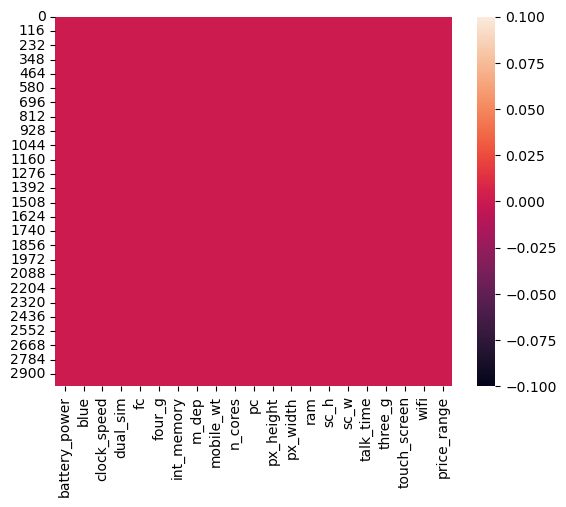

In [6]:
sns.heatmap(df.isna())

## Analyse de fond
**les statistiques des données**

**visualisation des données**

**relations entre données**

**relation target/données**

In [7]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3000 entries, 0 to 2999
Data columns (total 21 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   battery_power  3000 non-null   int64  
 1   blue           3000 non-null   int64  
 2   clock_speed    3000 non-null   float64
 3   dual_sim       3000 non-null   float64
 4   fc             3000 non-null   int64  
 5   four_g         3000 non-null   int64  
 6   int_memory     3000 non-null   int64  
 7   m_dep          3000 non-null   float64
 8   mobile_wt      3000 non-null   float64
 9   n_cores        3000 non-null   int64  
 10  pc             3000 non-null   int64  
 11  px_height      3000 non-null   int64  
 12  px_width       3000 non-null   int64  
 13  ram            3000 non-null   int64  
 14  sc_h           3000 non-null   int64  
 15  sc_w           3000 non-null   int64  
 16  talk_time      3000 non-null   int64  
 17  three_g        3000 non-null   int64  
 18  touch_sc

In [8]:
pd.set_option('display.max_columns', None)
pd.set_option('display.width', None) 

In [9]:
df.describe()

,battery_power,blue,clock_speed,dual_sim,fc,four_g,int_memory,m_dep,mobile_wt,n_cores,pc,px_height,px_width,ram,sc_h,sc_w,talk_time,three_g,touch_screen,wifi,price_range
count,3000.000000,3000.00000,3000.000000,3000.000000,3000.000000,3000.000000,3000.000000,3000.000000,3000.000000,3000.000000,3000.000000,3000.000000,3000.000000,3000.000000,3000.000000,3000.000000,3000.000000,3000.000000,3000.000000,3000.000000,3000.000000
mean,992.512333,416.50000,1.186833,0.853300,3.045333,1.878667,21.526667,11.551833,93.671833,49.517333,8.053667,433.423333,1043.384000,1829.400000,721.203667,7.843000,9.112667,4.202667,0.587333,0.504667,1.169000
std,526.848699,639.16693,0.867291,0.795118,3.980439,3.238432,20.999181,18.810166,71.941799,66.774816,5.761931,470.037698,523.078249,1011.226753,1183.132467,5.243172,5.753116,5.820672,0.492396,0.500062,1.065904
min,1.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.100000,0.100000,1.000000,0.000000,0.000000,0.000000,256.000000,5.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,601.000000,0.00000,0.500000,0.000000,0.000000,0.000000,1.000000,0.400000,0.800000,4.000000,3.000000,15.000000,646.750000,1015.000000,11.000000,4.000000,4.000000,1.000000,0.000000,0.000000,0.000000
50%,913.500000,1.00000,1.000000,1.000000,1.000000,1.000000,16.000000,0.800000,109.000000,7.000000,7.000000,282.500000,1019.500000,1647.000000,16.000000,7.000000,8.000000,1.000000,1.000000,1.000000,1.000000
75%,1432.250000,895.00000,1.900000,1.000000,5.000000,1.000000,40.000000,18.000000,156.000000,109.250000,12.000000,727.250000,1461.250000,2573.250000,1235.750000,12.000000,14.000000,6.250000,1.000000,1.000000,2.000000
max,1998.000000,1999.00000,3.000000,3.000000,19.000000,19.000000,64.000000,64.000000,200.000000,200.000000,20.000000,1960.000000,1998.000000,3998.000000,3989.000000,19.000000,20.000000,20.000000,1.000000,1.000000,3.000000


In [10]:
df.corr()

,battery_power,blue,clock_speed,dual_sim,fc,four_g,int_memory,m_dep,mobile_wt,n_cores,pc,px_height,px_width,ram,sc_h,sc_w,talk_time,three_g,touch_screen,wifi,price_range
battery_power,1.000000,-0.610675,0.367343,-0.411723,0.316844,-0.385896,0.466206,-0.550970,0.605323,-0.630797,0.319264,0.428544,0.364065,0.271000,-0.567093,-0.381582,0.336369,-0.546508,-0.158038,0.006986,0.404035
blue,-0.610675,1.000000,-0.509638,0.553858,-0.415284,0.543268,-0.652537,0.765763,-0.843055,0.871926,-0.418686,-0.586395,-0.509063,-0.374383,0.773497,0.505237,-0.433627,0.773133,0.229224,-0.008373,-0.404393
clock_speed,0.367343,-0.509638,1.000000,-0.328114,0.245171,-0.343266,0.391157,-0.456971,0.504765,-0.519157,0.246938,0.339797,0.293611,0.225216,-0.453498,-0.308179,0.249096,-0.465368,-0.117668,-0.023269,0.238230
dual_sim,-0.411723,0.553858,-0.328114,1.000000,-0.288597,0.367588,-0.439250,0.497835,-0.561897,0.580020,-0.288928,-0.397636,-0.334290,-0.223071,0.518096,0.325403,-0.308078,0.485138,0.134383,0.027007,-0.268883
fc,0.316844,-0.415284,0.245171,-0.288597,1.000000,-0.264821,0.300036,-0.373779,0.419829,-0.428542,0.698593,0.279340,0.249953,0.197304,-0.378888,-0.258840,0.204882,-0.375379,-0.119750,0.018991,0.214713
four_g,-0.385896,0.543268,-0.343266,0.367588,-0.264821,1.000000,-0.418898,0.489638,-0.543631,0.569285,-0.267877,-0.375541,-0.339814,-0.237534,0.480425,0.352222,-0.279143,0.477772,0.140896,0.001379,-0.271779
int_memory,0.466206,-0.652537,0.391157,-0.439250,0.300036,-0.418898,1.000000,-0.589007,0.639197,-0.675944,0.304071,0.457057,0.395052,0.312599,-0.600223,-0.391324,0.329181,-0.592827,-0.183621,0.008625,0.337956
m_dep,-0.550970,0.765763,-0.456971,0.497835,-0.373779,0.489638,-0.589007,1.000000,-0.760817,0.790233,-0.376937,-0.528965,-0.469990,-0.343291,0.702103,0.462748,-0.381841,0.702028,0.196806,0.001351,-0.363175
mobile_wt,0.605323,-0.843055,0.504765,-0.561897,0.419829,-0.543631,0.639197,-0.760817,1.000000,-0.873084,0.425277,0.583633,0.515484,0.376740,-0.776115,-0.518547,0.429313,-0.765705,-0.226666,0.005962,0.391780
n_cores,-0.630797,0.871926,-0.519157,0.580020,-0.428542,0.569285,-0.675944,0.790233,-0.873084,1.000000,-0.438578,-0.607243,-0.534365,-0.394027,0.812384,0.531129,-0.441727,0.793445,0.232404,0.001226,-0.412856


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


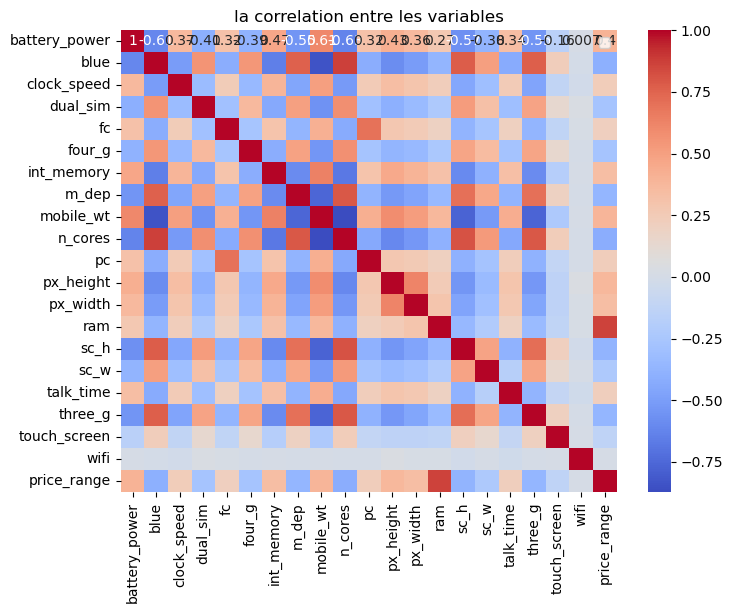

In [11]:
#c'est pas evident de lire toute la table et la comprendre 
corr_matrix = df.corr()
plt.figure(figsize=(8, 6))
sns.heatmap(corr_matrix, annot=True, cmap="coolwarm")
plt.title('la correlation entre les variables')
plt.legend()

In [12]:
df1=df.drop('price_range',axis=1)

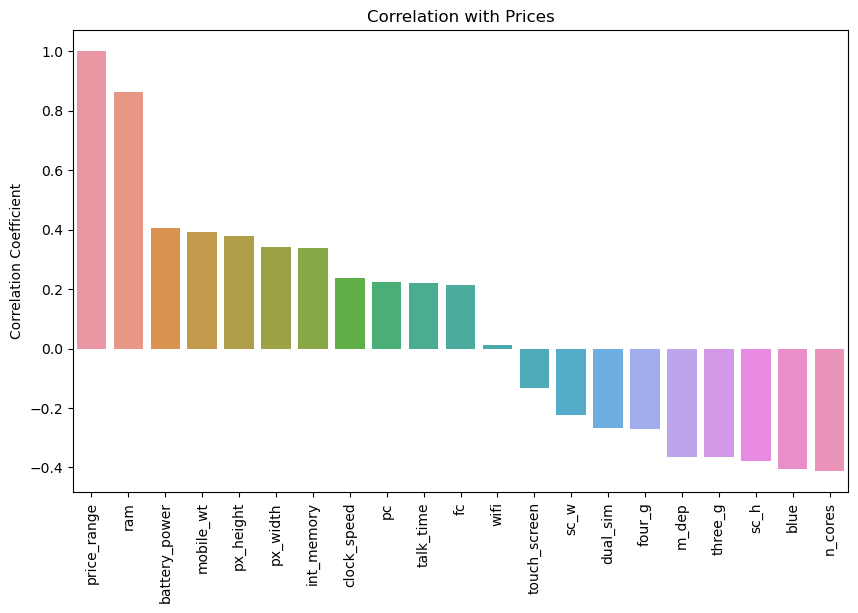

In [13]:
correlation = df.corr()['price_range'].sort_values(ascending=False)

# Plot the correlation
plt.figure(figsize=(10, 6))
sns.barplot(x=correlation.index, y=correlation.values)
plt.title('Correlation with Prices')
plt.xticks(rotation=90)
plt.ylabel('Correlation Coefficient')
plt.show()
# on peut voire que la taille de la ram a une très grande correlation avec le prix.

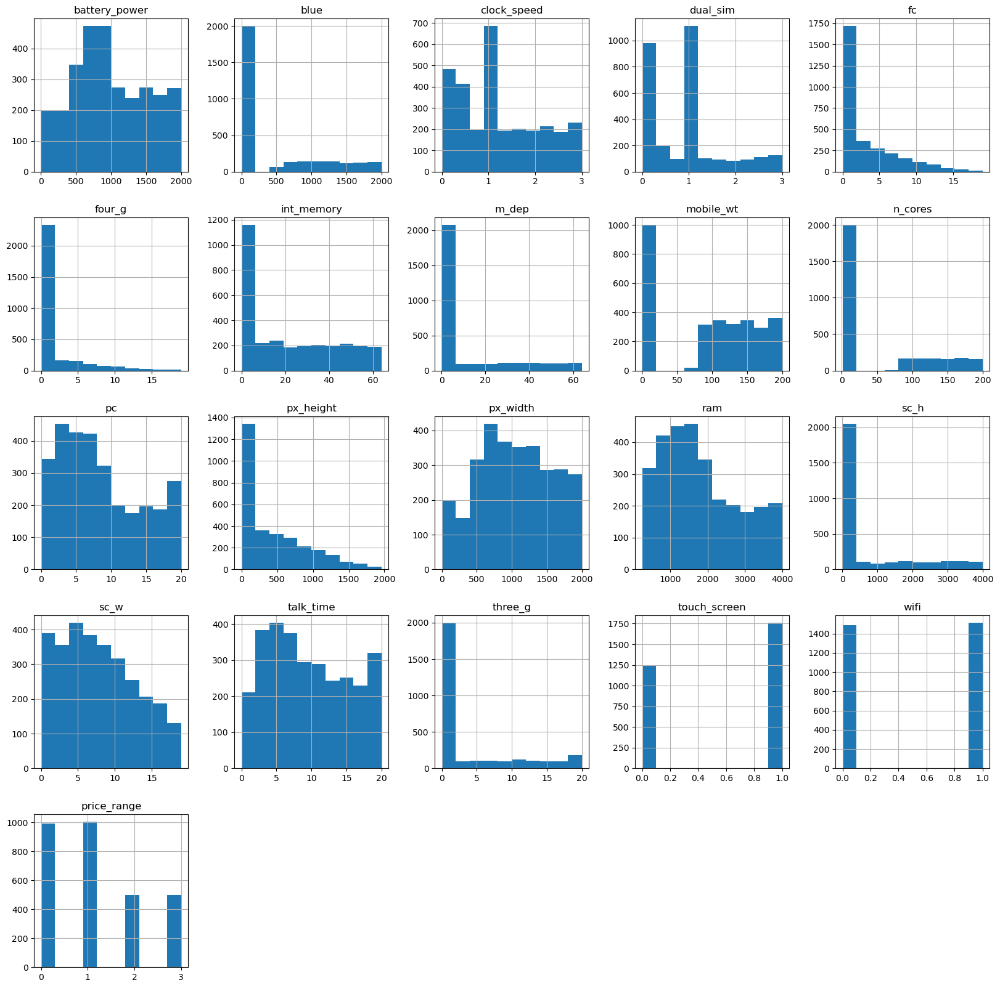

In [14]:
# nous visualison les histogrammes des variables
df.hist(figsize=(20,20))
plt.show()

c:\Users\DELL\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\DELL\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\DELL\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\DELL\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating ins

<Figure size 2000x2000 with 0 Axes>

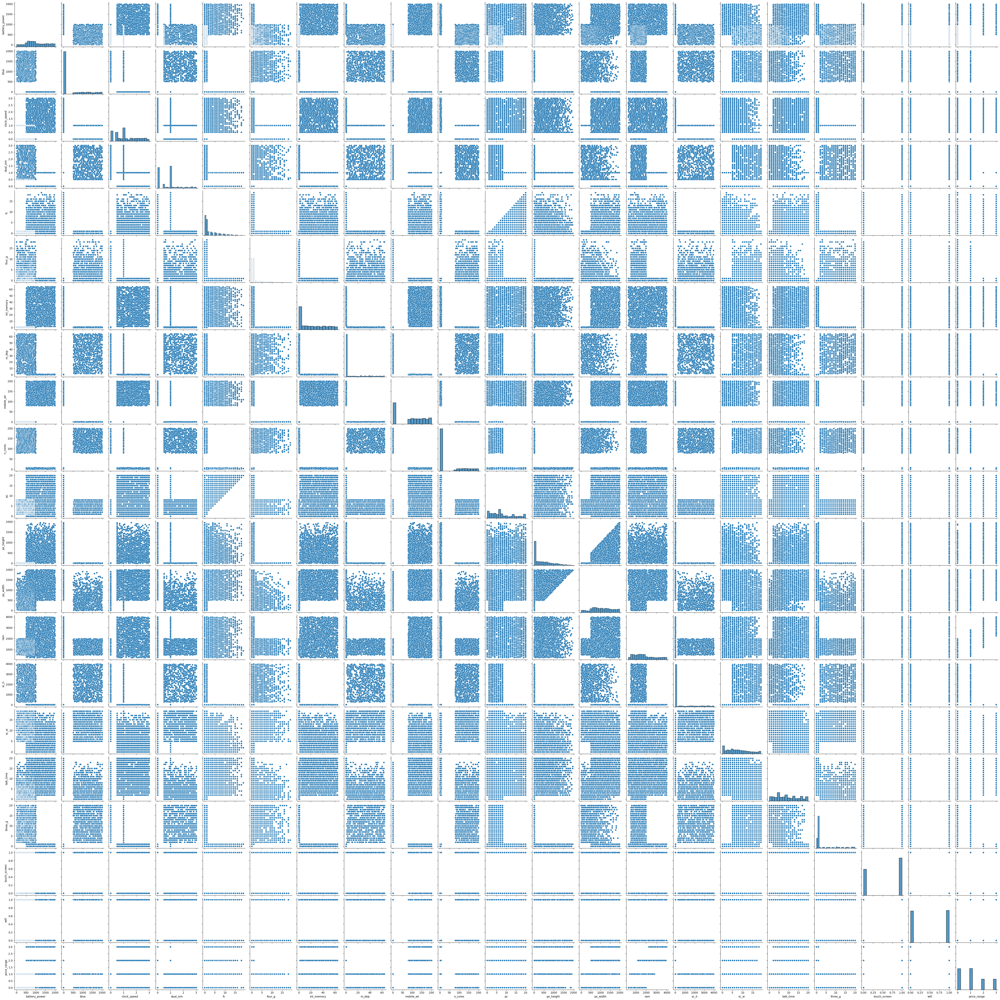

In [15]:
# les pairplot 
plt.figure(figsize=(20, 20)) 
sns.pairplot(data=df)
plt.show()

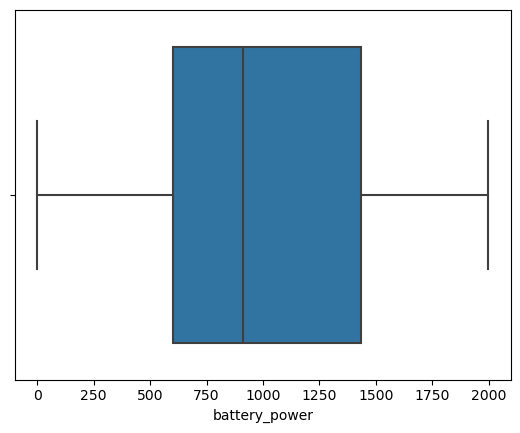

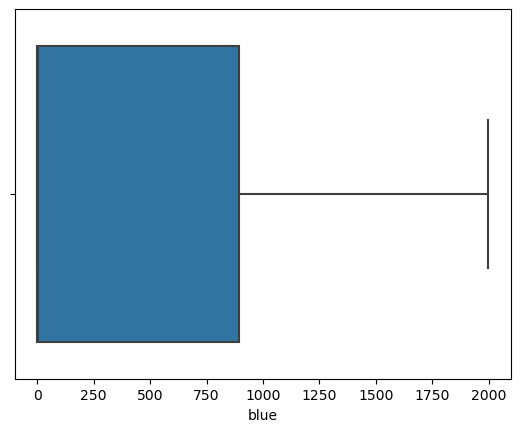

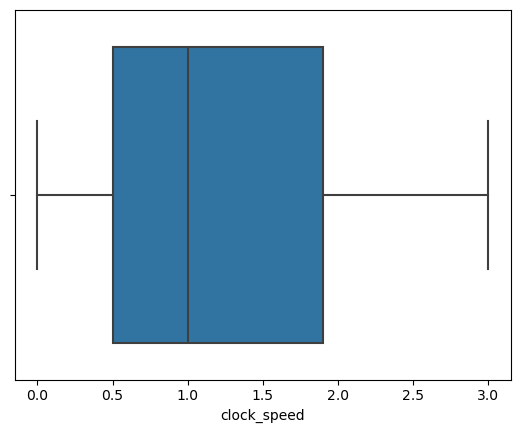

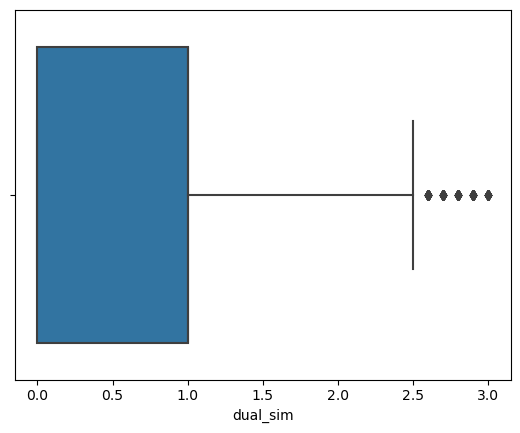

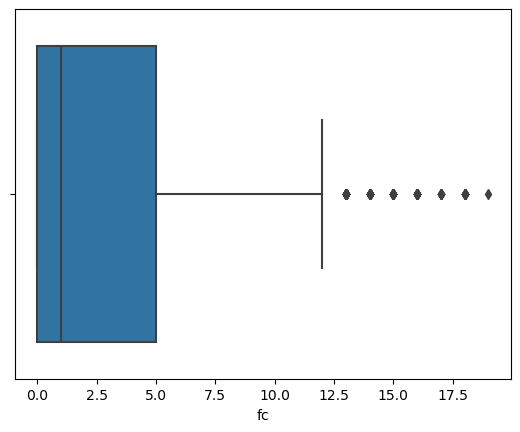

...

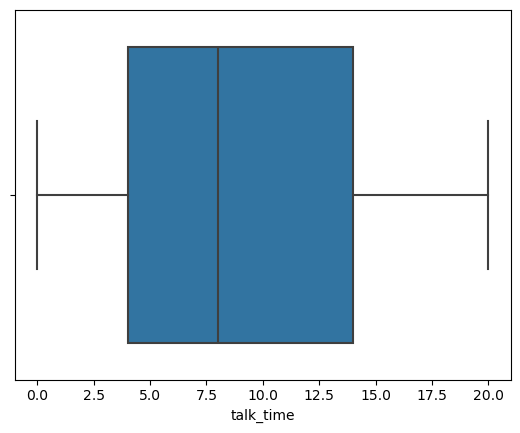

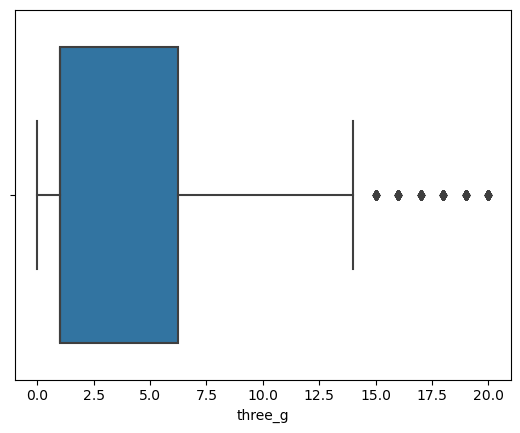

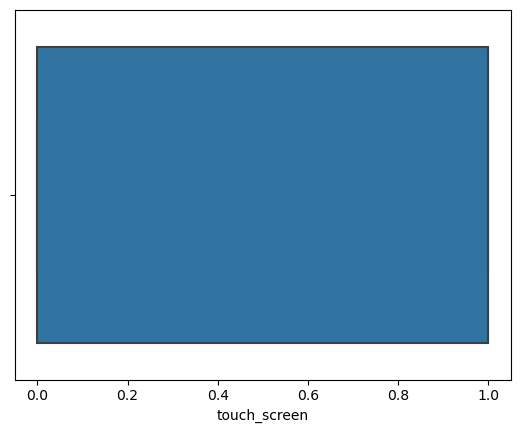

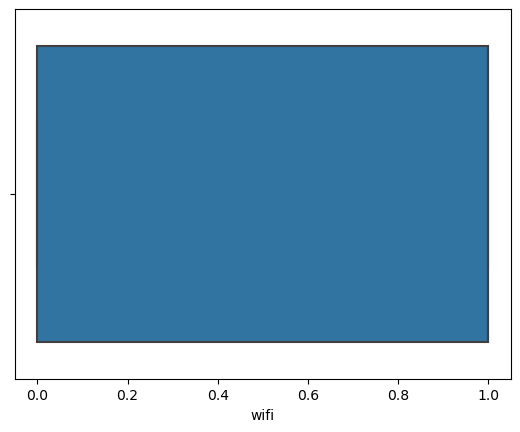

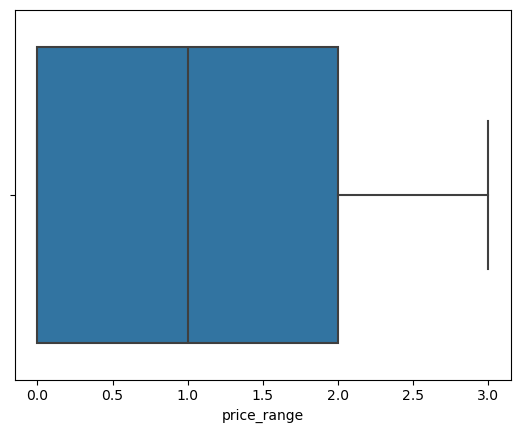

In [16]:
#les boites à moustaches
for i in df.columns:
    sns.boxplot(x= i, data=df)
    plt.show()

### pré-traitement des données

In [17]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import SVC
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay


In [18]:
X = df.drop('price_range', axis=1)
y = df['price_range']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

In [19]:
model1 = RandomForestClassifier(random_state=42)

In [20]:
model1.fit(X_train,y_train)

RandomForestClassifier(random_state=42)

In [21]:
y_pred1 = model1.predict(X_test)

In [22]:
print("Accuracy de random forest:", accuracy_score(y_test, y_pred1))
print("\nClassification Report:\n", classification_report(y_test, y_pred1))

Accuracy de random forest: 0.7433333333333333

Classification Report:
               precision    recall  f1-score   support

           0       0.70      0.72      0.71       310
           1       0.67      0.65      0.66       297
           2       0.83      0.84      0.84       150
           3       0.90      0.90      0.90       143

    accuracy                           0.74       900
   macro avg       0.77      0.78      0.77       900
weighted avg       0.74      0.74      0.74       900



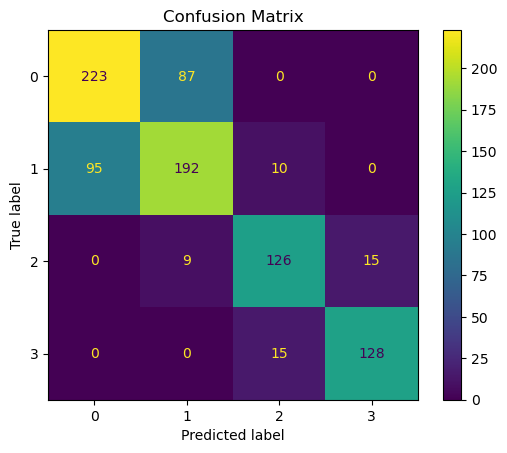

In [23]:
ConfusionMatrixDisplay.from_predictions(y_test, y_pred1)
plt.title('Confusion Matrix')
plt.show()

In [24]:
model2=SVC()

In [25]:
model2.fit(X_train,y_train)

SVC()

In [26]:
y_pred2=model2.predict(X_test)

In [27]:
print("Accuracy de SVC:", accuracy_score(y_test, y_pred2))
print("\nClassification Report:\n", classification_report(y_test, y_pred2))

Accuracy de SVC: 0.7888888888888889

Classification Report:
               precision    recall  f1-score   support

           0       0.72      0.75      0.73       310
           1       0.71      0.69      0.70       297
           2       0.94      0.91      0.93       150
           3       0.94      0.96      0.95       143

    accuracy                           0.79       900
   macro avg       0.83      0.83      0.83       900
weighted avg       0.79      0.79      0.79       900



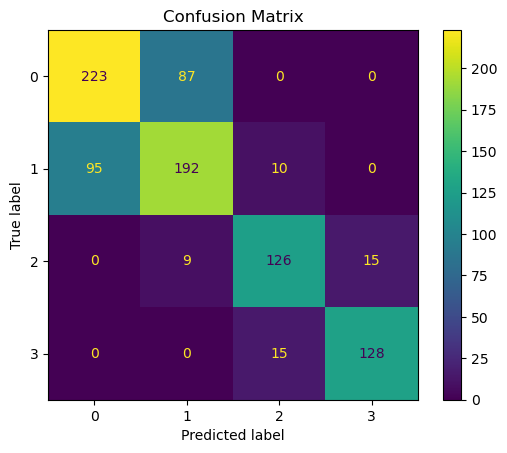

In [28]:
ConfusionMatrixDisplay.from_predictions(y_test, y_pred1)
plt.title('Confusion Matrix')
plt.show()